In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.insert(0, '../')
import rhkpy

import matplotlib.pyplot as pl
import numpy as np
import xarray as xr
import hvplot.xarray
import holoviews as hv
import panel as pn

# Plotting tests

## `qplot()` testing

In [3]:
fpath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\ABC\STM\stacking faults\FLG25(9) - 6 layer' + '\\'
m = rhkpy.rhkdata(fpath + 'MK_ABC_FLG_25_9K_2023_07_24_17_51_20_911.sm4')

In [4]:
m_abs = m.coord_to_absolute()

In [5]:
m.qplot()

BokehModel(combine_events=True, render_bundle={'docs_json': {'371dea82-4f07-4494-b030-d6eb0ed2c886': {'version…

In [6]:
filename_izmap = 'Iz_map_Stripes-9K-HOPG-SPI2-3_2021_09_08_11_21_03_743.sm4'
izmap = rhkpy.rhkdata(filename_izmap)

In [7]:
izmap_abs = izmap.coord_to_absolute()

In [8]:
iz_topo = izmap_abs.image.topography[:, :, 0].hvplot(x = 'x', y = 'y', cmap = 'viridis')
temp = izmap.spectra.drop(['z', 'repetitions', 'zscandir']).drop_vars(['current'])
iz_specpos = temp.hvplot.scatter(x = 'x', y = 'y', marker = 'x', groupby = [])

In [9]:
iz_topo * iz_specpos

:Overlay
   .Image.I   :Image   [x,y]   (topography)
   .Scatter.I :Scatter   [x]   (y)

In [10]:
izmap_abs.qplot()

BokehModel(combine_events=True, render_bundle={'docs_json': {'c445d16c-7a9b-4a45-8405-c54480f50b03': {'version…

In [11]:
datapath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\cikkek - published\2022\RG magnetism\figures\splitting' + '\\'
filename_map209 = '9K_ABC6_2020_11_02_08_47_19_209.sm4'
map209 = rhkpy.rhkdata(datapath + filename_map209)

In [12]:
map209_plot = map209.qplot()
map209_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'0a126736-0593-42a8-b640-8c554440eeb6': {'version…

In [13]:
map209._qplot_topo(cmap_topo = 'Blues_r')

:Image   [x,y]   (topography)

In [14]:
map209._qplot_lia()

:Image   [x,y]   (lia)

In [15]:
map209._qplot_map_iv()

BokehModel(combine_events=True, render_bundle={'docs_json': {'37c9e7b5-24ef-48ea-8fbf-6f18863b521f': {'version…

Plot the spectrum positions in hvplot

In [16]:
temp = map209.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])

In [17]:
temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], aspect = 1, color = 'red', marker = 'dot')

:Scatter   [x]   (y)

In [18]:
filename = 'line_9K_ABC6_2020_11_01_12_12_27_213.sm4'
linespec = rhkpy.rhkdata(filename)

In [19]:
lineiv_plot = linespec.qplot()
lineiv_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'83eca6e4-73b8-454a-8b6d-3915b561865e': {'version…

In [20]:
linespec._qplot_line_iv(cmap_spec = 'RdBu_r')

:Image   [bias,dist]   (lia)

In [21]:
linespec._qplot_line_spec_iv()

BokehModel(combine_events=True, render_bundle={'docs_json': {'92c91927-4236-40b1-afbc-8d6ad09a4e4a': {'version…

In [22]:
izline_filename = 'Iz_line_Stripes-9K-HOPG-SPI2-3_2021_09_02_15_15_35_930.sm4'
izline = rhkpy.rhkdata(izline_filename)

In [23]:
izline_plot = izline.qplot()
izline_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'5c86b350-2074-4fc9-ac86-327fca500682': {'version…

In [24]:
izline._qplot_line_spec_iz()

BokehModel(combine_events=True, render_bundle={'docs_json': {'e4f95994-638a-40b7-a8a3-7e42e437ab2b': {'version…

In [25]:
filename_singlespec = 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4'
spec = rhkpy.rhkdata(filename_singlespec)

In [26]:
spec_plot = spec.qplot()
spec_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'ec27606c-b551-49b1-bab6-ef074343f4aa': {'version…

In [27]:
spec_plot.save('test.png')

In [28]:
iz_single_filename = 'Iz_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_15_28_529.sm4'
izspec = rhkpy.rhkdata(iz_single_filename)

In [29]:
izspec.qplot()

BokehModel(combine_events=True, render_bundle={'docs_json': {'4a0a9062-9369-4fbb-b99e-51848dc4cc4c': {'version…

In [30]:
topo_lia = rhkpy.rhkdata('lia_image_ABC_Graphite-Sample5_9K_2021_08_17_23_02_19_872.sm4')

In [31]:
topo_lia.qplot()

BokehModel(combine_events=True, render_bundle={'docs_json': {'60290eef-5ee9-4617-9c60-edeb5d1c9b93': {'version…

## testing thumbnail generation

In [32]:
# rhkpy.genthumbs()

# Navigator

In [33]:
datapath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\cikkek - published\2022\RG magnetism\figures\splitting' + '\\'
filename_map209 = '9K_ABC6_2020_11_02_08_47_19_209.sm4'
map209 = rhkpy.rhkdata(datapath + filename_map209)
filename = 'line_9K_ABC6_2020_11_01_12_12_27_213.sm4'
linespec = rhkpy.rhkdata(filename)
filename_singlespec = 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4'
spec = rhkpy.rhkdata(filename_singlespec)

In [34]:
map209_abs = map209.coord_to_absolute()
map_topo_plot = map209_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone', label = 'topo file')

In [35]:
map_specpos = map209.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map_specpos_plot = map_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', aspect = 'equal', marker = 'x', color = 'blue', label = 'mapspec positions')

In [36]:
map_topo_plot * map_specpos_plot

:Overlay
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)

In [37]:
temp = linespec.spectra.drop_vars(['lia', 'current']).drop(['biasscandir', 'repetitions', 'bias'])
line_specpos_plot = temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', color = 'blue', aspect = 'equal', label = 'linespec')

In [38]:
map_topo_plot * line_specpos_plot

:Overlay
   .Image.Topo_file  :Image   [x,y]   (topography)
   .Scatter.Linespec :Scatter   [x]   (y)

In [39]:
spec.spectra

<xarray.Dataset>
Dimensions:      (bias: 481, repetitions: 3, biasscandir: 2)
Coordinates:
  * bias         (bias) float64 0.6 0.5975 0.595 0.5925 ... -0.595 -0.5975 -0.6
  * repetitions  (repetitions) int32 0 1 2
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, repetitions, biasscandir) float64 1.446 1.554 ... 0.9922
    current      (bias, repetitions, biasscandir) float64 44.3 49.2 ... -35.42
    x            float64 -97.14
    y            float64 -73.08
Attributes: (12/18)
    filename:           dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4
    speccoord_x:        -97.14440096786348
    speccoord_y:        -73.07891536356692
    speccoord_x units:  nm
    speccoord_y units:  nm
    bias:               0.59999996
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1266.9999999999998
    LI frequency unit:  Hz
    LI phase:           -104.9999999
    datatype:           spec
    spectype:           iv

In [40]:
spec_pos_plot = spec.spectra.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', color = 'blue', aspect = 1, label = 'single spec')
spec_pos_plot

:Scatter   [x]   (y)

In [41]:
map_topo_plot * line_specpos_plot * spec_pos_plot

:Overlay
   .Image.Topo_file     :Image   [x,y]   (topography)
   .Scatter.Linespec    :Scatter   [x]   (y)
   .Scatter.Single_spec :Scatter   [x]   (y)

Load some data where there is overlap

In [42]:
folder = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\ABC\STM\stacking faults\FLG25(9) - 6 layer' + '\\'
map238 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238.sm4')
line934 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_08_01_20_29_23_934.sm4')

In [43]:
map238_abs = map238.coord_to_absolute()
map238_topo_plot = map238_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone', label = 'topo file')
map238_specpos = map238.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map238_specpos_plot = map238_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', marker = 'x', label = 'mapspec positions')

In [44]:
map238.spectra

<xarray.Dataset>
Dimensions:      (bias: 321, specpos_y: 32, specpos_x: 32, repetitions: 1,
                  biasscandir: 2)
Coordinates:
  * bias         (bias) float64 0.6 0.5963 0.5925 ... -0.5925 -0.5962 -0.6
  * specpos_x    (specpos_x) float64 88.27 82.02 75.77 ... -92.98 -99.23 -105.5
  * specpos_y    (specpos_y) float64 710.2 703.9 697.7 ... 528.9 522.7 516.4
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    current      (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    x            (specpos_y, specpos_x) float64 88.27 82.02 ... -99.23 -105.5
    y            (specpos_y, specpos_x) float64 710.2 710.2 ... 516.4 516.4
Attributes: (12/15)
    filename:           MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238.sm4
    bias:               0.4999996
    bias units:         V
    setpoint:           99.99999439624929
    setpoint units:     pA
    measurement date:   07/31/23
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1372.0
    LI frequency unit:  Hz
    LI phase:           -105.9999999
    datatype:           map
    spectype:           iv

In [45]:
temp = line934.spectra.drop_vars(['lia', 'current']).drop(['biasscandir', 'repetitions', 'bias'])
line_specpos_plot = temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', label = 'linespec')

In [46]:
combined_plot = map238_topo_plot * line_specpos_plot * map238_specpos_plot
combined_plot.opts(aspect = 'equal', frame_width = 300, frame_height = 300)

:Overlay
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Linespec          :Scatter   [x]   (y)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)

This is a zoomed out map

In [47]:
map306 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_07_27_08_11_22_306.sm4')

In [48]:
map306_abs = map306.coord_to_absolute()
map306_topo_plot = map306_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone')
map306_specpos = map306.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map306_specpos_plot = map306_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', marker = 'x', label = 'mapspec positions')

Let's plot some lines around the topography

In [49]:
l_top = map306_abs.image.topography.drop('scandir')[-1, :].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue', label = 'topo file large')
l_bottom = map306_abs.image.topography.drop('scandir')[0, :].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')
l_left = map306_abs.image.topography.drop('scandir')[:, 0].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')
l_right = map306_abs.image.topography.drop('scandir')[:, -1].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')

In [50]:
bounding_box = l_bottom * l_left * l_right * l_top

In [51]:
combined = map306_topo_plot * map238_topo_plot * line_specpos_plot * map306_specpos_plot * bounding_box
combined.opts(aspect = 'equal', frame_width = 300, frame_height = 300)

:Overlay
   .Image.I                   :Image   [x,y]   (topography)
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Linespec          :Scatter   [x]   (y)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)
   .Curve.I                   :Curve   [x]   (y)
   .Curve.II                  :Curve   [x]   (y)
   .Curve.III                 :Curve   [x]   (y)
   .Curve.Topo_file_large     :Curve   [x]   (y)

In [52]:
izsingle = rhkpy.rhkdata("Iz_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_15_28_529.sm4")

In [53]:
rhkpy.navigation(map209, map238, line934, izline, topo_lia, izsingle, spec, izmap)

:Overlay
   .Image.I                                                                                                                                                    :Image   [x,y]   (topography)
   .Curve.I                                                                                                                                                    :Curve   [x]   (y)
   .Curve.II                                                                                                                                                   :Curve   [x]   (y)
   .Curve.III                                                                                                                                                  :Curve   [x]   (y)
   .Curve.A_9K_ABC6_2020_11_02_08_47_19_209_full_stop_sm4                                                                                                      :Curve   [x]   (y)
   .Image.II                                                                                                                                                   :Image   [x,y]   (topography)
   .Curve.IV                                                                                                                                                   :Curve   [x]   (y)
   .Curve.V                                                                                                                                                    :Curve   [x]   (y)
   .Curve.VI                                                                                                                                                   :Curve   [x]   (y)
   .Curve.MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238_full_stop_sm4                                                                                               :Curve   [x]   (y)
   .Image.III                                                                                                                                                  :Image   [x,y]   (topography)
   .Curve.VII                                                                                                                                                  :Curve   [x]   (y)
   .Curve.VIII                                                                                                                                                 :Curve   [x]   (y)
   .Curve.IX                                                                                                                                                   :Curve   [x]   (y)
   .Curve.Lia_image_ABC_Graphite_hyphen_minus_Sample5_9K_2021_08_17_23_02_19_872_full_stop_sm4                                                                 :Curve   [x]   (y)
   .Image.IV                                                                                                                                                   :Image   [x,y]   (topography)
   .Curve.X                                                                                                                                                    :Curve   [x]   (y)
   .Curve.XI                                                                                                                                                   :Curve   [x]   (y)
   .Curve.XII                                                                                                                                                  :Curve   [x]   (y)
   .Curve.Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4                              :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_9K_ABC6_2020_11_02_08_47_19_209_full_stop_sm4                                                                                       :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238_full_stop_sm4                                                                              :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_

In [54]:
spec.spectra.attrs

{'filename': 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4',
 'speccoord_x': -97.14440096786348,
 'speccoord_y': -73.07891536356692,
 'speccoord_x units': 'nm',
 'speccoord_y units': 'nm',
 'bias': 0.59999996,
 'bias units': 'V',
 'setpoint': 39.999996370720936,
 'setpoint units': 'pA',
 'measurement date': '09/07/21',
 'measurement time': '10:19:42',
 'LI amplitude': 10.0,
 'LI amplitude unit': 'mV',
 'LI frequency': 1266.9999999999998,
 'LI frequency unit': 'Hz',
 'LI phase': -104.9999999,
 'datatype': 'spec',
 'spectype': 'iv'}

Testing with the data from Konrad

In [55]:
folderpath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\30 fok kep + spektrum' + '\\'
spec1 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_14_16_826.sm4')
spec2 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_20_12_513.sm4')
spec3 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_21_55_854.sm4')
spec4 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_24_00_507.sm4')
topo321 = rhkpy.rhkdata(folderpath + 'MK_ABC_FLG_26_9K_2023_05_19_11_11_33_321.sm4')
folderpath2 = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\30 fok dIdV terkep' + '\\'
map505 = rhkpy.rhkdata(folderpath2 + 'MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505.sm4')
folderpath3 = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\0 fok dIdV terkepek' + '\\'
map217 = rhkpy.rhkdata(folderpath3 + 'MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217.sm4')

In [123]:
rhkpy.navigation(map217, map505, spec2, spec3, spec4)

:Overlay
   .Image.MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217_full_stop_sm4                                     :Image   [x,y]   (topography)
   .Curve.I                                                                                          :Curve   [x]   (y)
   .Curve.II                                                                                         :Curve   [x]   (y)
   .Curve.III                                                                                        :Curve   [x]   (y)
   .Curve.IV                                                                                         :Curve   [x]   (y)
   .Image.MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4                                     :Image   [x,y]   (topography)
   .Curve.V                                                                                          :Curve   [x]   (y)
   .Curve.VI                                                                                         :Curve   [x]   (y)
   .Curve.VII                                                                                        :Curve   [x]   (y)
   .Curve.VIII                                                                                       :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217_full_stop_sm4                    :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4                    :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_20_12_513_full_stop_sm4 :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_21_55_854_full_stop_sm4 :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_24_00_507_full_stop_sm4 :Scatter   [x]   (y)

In [102]:
spec2.spectra.drop(['bias', 'repetitions', 'biasscandir'])

<xarray.Dataset>
Dimensions:  (bias: 334, repetitions: 1, biasscandir: 2)
Dimensions without coordinates: bias, repetitions, biasscandir
Data variables:
    lia      (bias, repetitions, biasscandir) float64 2.599 2.438 ... 4.431
    current  (bias, repetitions, biasscandir) float64 224.9 212.9 ... -373.3
    x        float64 -803.0
    y        float64 -800.7
Attributes: (12/18)
    filename:           dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_20_12_513.sm4
    speccoord_x:        -803.0169738049153
    speccoord_y:        -800.6986149666773
    speccoord_x units:  nm
    speccoord_y units:  nm
    bias:               0.49999896
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1372.0
    LI frequency unit:  Hz
    LI phase:           -102.9999998
    datatype:           spec
    spectype:           iv

In [121]:
hv.Scatter((spec2.spectra.x.data, spec2.spectra.y.data)).opts(marker = 'x', size = 20, line_width = 3, clabel = 'z')

:Scatter   [x]   (y)

In [104]:
spec2.spectra.drop(['bias', 'repetitions', 'biasscandir']).hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', size = 200, line_width = 3, label = 'z')

:Scatter   [x]   (y)

In [120]:
rhkpy.navigation(izmap)

:Overlay
   .Image.Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4                  :Image   [x,y]   (topography)
   .Curve.I                                                                                                                                        :Curve   [x]   (y)
   .Curve.II                                                                                                                                       :Curve   [x]   (y)
   .Curve.III                                                                                                                                      :Curve   [x]   (y)
   .Curve.IV                                                                                                                                       :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4 :Scatter   [x]   (y)

# Taking section along two points

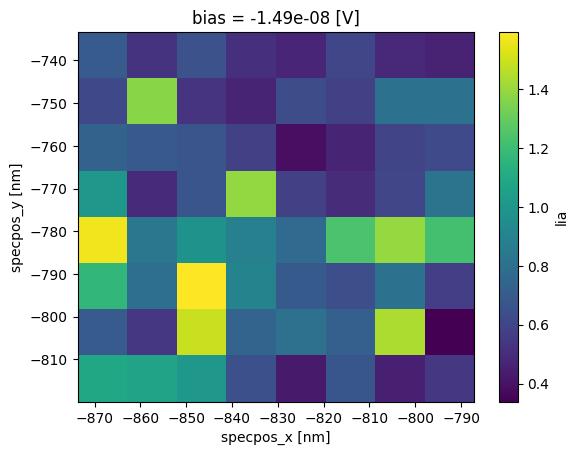

In [58]:
temp = map505.mrep().msw().spectra.lia.sel(bias = 0, method = 'nearest')
temp.plot()

In [59]:
temp = map505.mrep().msw().spectra.lia

In [60]:
specpos_x_line = np.linspace(-860, -800, 15)
specpos_y_line = np.linspace(-805, -805, 15)

In [61]:
dist = np.sqrt((specpos_x_line - specpos_x_line[0]) ** 2 + (specpos_y_line - specpos_y_line[0]) ** 2)

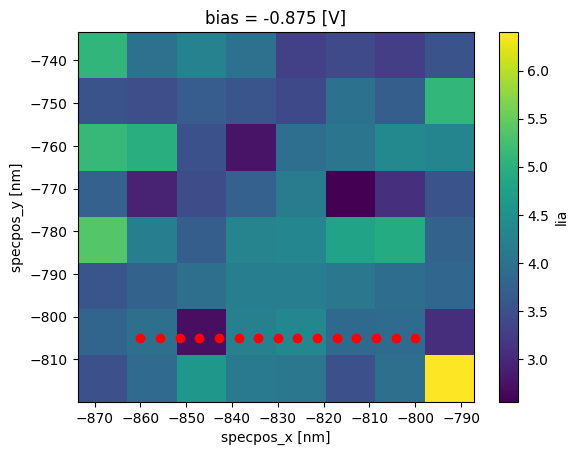

In [62]:
temp.isel(bias = 150).plot()
pl.scatter(specpos_x_line, specpos_y_line, color = 'r')

In [63]:
lia_section = []
for sx, sy in zip(specpos_x_line, specpos_y_line):
    lia_values = temp.interp(specpos_x=sx, specpos_y=sy, method='nearest')
    lia_section += [lia_values.data]
lia_section = np.array(lia_section)

In [64]:
lia_section.shape, temp.bias.data.shape

((15, 161), (161,))

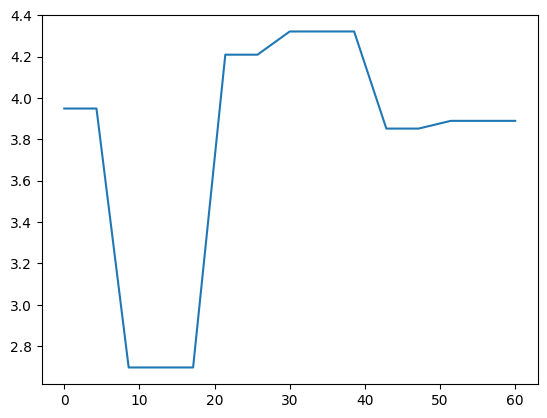

In [65]:
pl.plot(dist, lia_section[:, 150])

In [66]:
# Create a new DataArray with the lia values along the section
new_da = xr.DataArray(
    np.array(lia_section),
    dims=['dist', 'bias'],
    coords={'dist': dist, 'bias': temp['bias']}
)

In [67]:
new_da

<xarray.DataArray (dist: 15, bias: 161)>
array([[4.65005168, 4.72296492, 4.48597592, ..., 4.80693296, 4.64939742,
        4.94038916],
       [4.65005168, 4.72296492, 4.48597592, ..., 4.80693296, 4.64939742,
        4.94038916],
       [2.94497468, 3.12534625, 2.99248843, ..., 3.17279248, 3.19130484,
        3.18354227],
       ...,
       [3.64473553, 3.76033594, 3.7873606 , ..., 4.69272721, 4.59599772,
        4.92017713],
       [3.64473553, 3.76033594, 3.7873606 , ..., 4.69272721, 4.59599772,
        4.92017713],
       [3.64473553, 3.76033594, 3.7873606 , ..., 4.69272721, 4.59599772,
        4.92017713]])
Coordinates:
  * dist     (dist) float64 0.0 4.286 8.571 12.86 ... 47.14 51.43 55.71 60.0
  * bias     (bias) float64 1.0 0.9875 0.975 0.9625 ... -0.975 -0.9875 -1.0

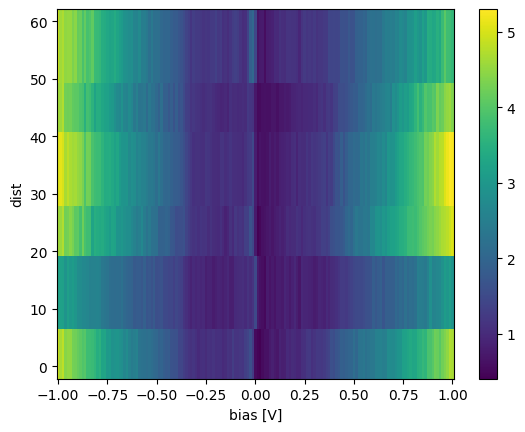

In [68]:
new_da.plot()

Let's try a better map.

In [69]:
datafolder = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\lectures - conferences\2023\Kirchberg\poster - stacking faults\intro' + '\\'
map533 = rhkpy.rhkdata(datafolder + 'ABC_Graphite-Sample5_9K_2021_08_23_02_27_55_533.sm4')

In [70]:
map533.qplot()

BokehModel(combine_events=True, render_bundle={'docs_json': {'35a54ef3-f9f4-419a-a6f9-733075da7b0c': {'version…

In [71]:
x0 = -480
x1 = -392
y0 = -930
y1 = -856
pixsize = np.abs(map533.spectra.specpos_x[1] - map533.spectra.specpos_x[0]).data
dist_length = np.sqrt((x1 - x0)**2 + (y1 - y0)**2)

specpos_x_line = np.linspace(x0, x1, int(dist_length / pixsize) + 1)
specpos_y_line = np.linspace(y0, y1, int(dist_length / pixsize) + 1)

In [72]:
dist = np.sqrt((specpos_x_line - specpos_x_line[0]) ** 2 + (specpos_y_line - specpos_y_line[0]) ** 2)

In [73]:
specpos_x_line.shape, map533.spectra.specpos_x.data.shape, map533.spectra.specpos_y.data.shape

((59,), (64,), (64,))

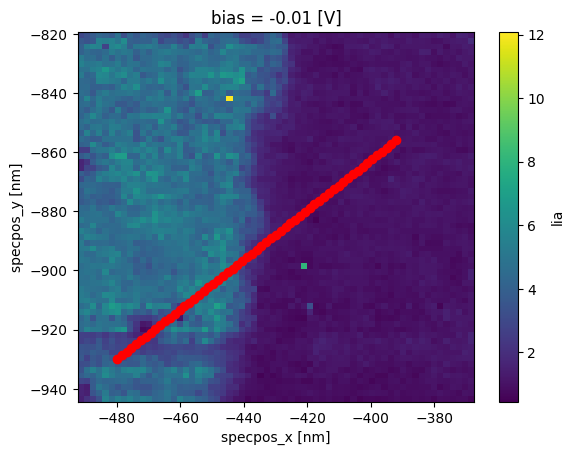

In [74]:
temp = map533.spectra.lia.mean(dim = ['repetitions', 'biasscandir'])
temp.isel(bias = 255).plot()
pl.scatter(specpos_x_line, specpos_y_line, color = 'r')

In [75]:
data_section = []
for sx, sy in zip(specpos_x_line, specpos_y_line):
    data_values = map533.spectra.lia.interp(specpos_x = sx, specpos_y = sy, method = 'nearest')
    data_section += [data_values.data]
data_section = np.array(data_section)

In [76]:
dist.shape, data_section.shape, map533.spectra.lia.data.shape

((59,), (59, 501, 1, 2), (501, 64, 64, 1, 2))

In [77]:
new_da = xr.DataArray(
    data_section,
    dims=['dist', 'bias', 'repetitions', 'biasscandir'],
    coords={'dist': dist, 'bias': map533.spectra.bias, 'repetitions': map533.spectra.repetitions, 'biasscandir': map533.spectra.biasscandir}
)

In [78]:
new_da

<xarray.DataArray (dist: 59, bias: 501, repetitions: 1, biasscandir: 2)>
array([[[[3.00972255, 3.54389658]],

        [[3.23371028, 3.46380284]],

        [[3.36624214, 3.45741397]],

        ...,

        [[5.10468145, 5.2350247 ]],

        [[5.20171594, 5.15660734]],

        [[5.3680129 , 5.1702419 ]]],


       [[[3.02688682, 3.0954927 ]],

        [[3.00071666, 3.14953735]],

        [[2.9484229 , 3.14912291]],
...
        [[4.97604717, 5.10009934]],

        [[4.8922328 , 5.24598636]],

        [[5.22599552, 5.12540803]]],


       [[[4.17422966, 4.11411745]],

        [[4.07977959, 4.10968901]],

        [[3.99701761, 3.98323869]],

        ...,

        [[4.84130808, 4.8357248 ]],

        [[4.6887947 , 4.84833957]],

        [[4.85042107, 4.77247403]]]])
Coordinates:
  * dist         (dist) float64 0.0 1.982 3.965 5.947 ... 111.0 113.0 115.0
  * bias         (bias) float64 0.5 0.498 0.496 0.494 ... -0.496 -0.498 -0.5
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'

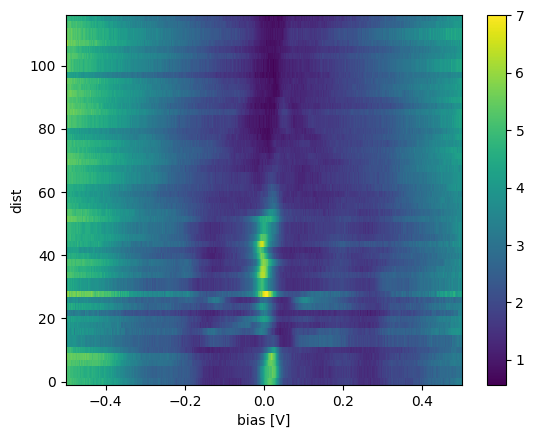

In [79]:
new_da.mean(dim = ['repetitions', 'biasscandir']).plot()

In [80]:
linespec.spectra

<xarray.Dataset>
Dimensions:      (bias: 501, dist: 64, repetitions: 1, biasscandir: 2)
Coordinates:
  * bias         (bias) float64 0.5 0.498 0.496 0.494 ... -0.496 -0.498 -0.5
  * dist         (dist) float64 0.0 0.5279 1.056 1.584 ... 32.2 32.73 33.26
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, dist, repetitions, biasscandir) float64 3.585 ... 5.185
    current      (bias, dist, repetitions, biasscandir) float64 99.49 ... -132.7
    x            (dist) float64 -37.48 -36.97 -36.45 ... -5.902 -5.384 -4.866
    y            (dist) float64 -173.5 -173.6 -173.7 ... -179.7 -179.9 -180.0
Attributes: (12/15)
    filename:           line_9K_ABC6_2020_11_01_12_12_27_213.sm4
    bias:               0.49999988
    bias units:         V
    setpoint:           99.99999439624929
    setpoint units:     pA
    measurement date:   11/01/20
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1300.0
    LI frequency unit:  Hz
    LI phase:           -102.9999998
    datatype:           line
    spectype:           iv

## Testing `rhkpy_process.mapsection()`

In [81]:
line_section = rhkpy.mapsection(map533.spectra, (-480, -930), (-392, -856))

In [82]:
line_section

<xarray.Dataset>
Dimensions:      (bias: 501, repetitions: 1, biasscandir: 2, dist: 59)
Coordinates:
  * bias         (bias) float64 0.5 0.498 0.496 0.494 ... -0.496 -0.498 -0.5
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'
  * dist         (dist) float64 0.0 1.982 3.965 5.947 ... 111.0 113.0 115.0
Data variables:
    lia          (bias, dist, repetitions, biasscandir) float64 3.145 ... 4.962
    current      (bias, dist, repetitions, biasscandir) float64 101.6 ... -137.6
    x            (dist) float64 -480.0 -478.5 -477.0 ... -395.0 -393.5 -392.0
    y            (dist) float64 -930.0 -928.7 -927.4 ... -858.6 -857.3 -856.0

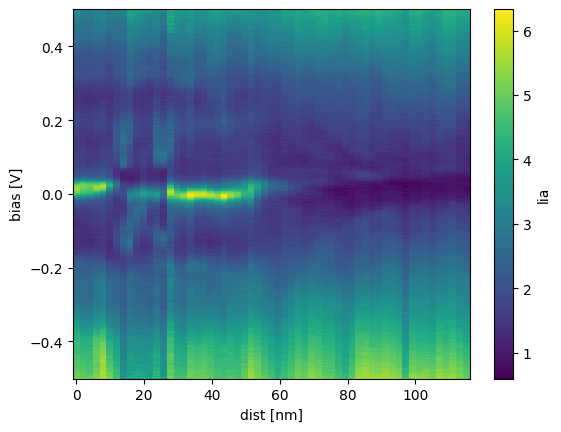

In [83]:
line_section.mean(dim = ['repetitions', 'biasscandir']).lia.plot()

In [84]:
data_section_plot = line_section.mean(dim = ['repetitions', 'biasscandir']).lia.hvplot(x = 'bias', y = 'dist', groupby = [], aspect = 1, cmap = 'plasma')

In [85]:
section_plot = line_section.mean(dim = ['repetitions', 'biasscandir']).hvplot.line(x = 'x', y = 'y', groupby = [], color = 'red')

In [86]:
data_section_plot

:Image   [bias,dist]   (lia)

In [87]:
map533._qplot_map_iv() * section_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'a892a01e-c5eb-429f-9690-7f22a5a48779': {'version…